In [1]:
from pathlib import Path
PROJECT_FOLDER = Path.cwd().parents[1]

import yaml
with open('config.yaml', 'r', encoding='utf-8') as f: 
    config = yaml.safe_load(f)

import sys, os
sys.path.append(PROJECT_FOLDER)
os.chdir(PROJECT_FOLDER)

print(sys.path[-1])
print(config)

/Users/sam/NUS/NUSC-ISC-FootballAnalysis
{'experiment_name': 'ex05_field_masking', 'pitch_cover_model': 'wandb_logs/ISC-Football/pc7g8srb/checkpoints/epoch=20-step=252.ckpt', 'gaussian_heatmap_model': 'wandb_logs/ISC-Football/j333rvqe/checkpoints/epoch=31-step=896.ckpt', 'pitch_calibration_dataset': {'img_folder': 'data/calibration', 'n_limit': 128, 'width': 640, 'height': 360, 'centered': False, 'keypoint_only': False, 'in_channels': 3}, 'pitch_calibration_datamodule': {'batch_size': 8, 'num_workers': 8, 'persistent_workers': True}, 'spiideo_dataset': {'base_folder': 'data/SpiideoSynLoc', 'n_limit': 32, 'width': 3840, 'height': 2160, 'n_crops': 32, 'crop_width': 960, 'crop_height': 540, 'crop_export_width': 320, 'crop_export_height': 180, 'sigma': 8, 'oversampling_rate': 16.0, 'in_channels': 3}, 'spiideo_datamodule': {'batch_size': 8, 'num_workers': 10, 'persistent_workers': True}, 'trainer': {'accelerator': 'gpu', 'max_epochs': 32}}


In [2]:
%load_ext autoreload
%autoreload 2

import gc
import cv2
import torch
from torch.utils.data import DataLoader
from torchvision.utils import make_grid
import torch.nn.functional as TorchF
import torchvision.transforms.functional as TorchvisionF

import numpy as np
import matplotlib.pyplot as plt
import random
import requests
from PIL import Image

from dataobjects.pitch import Pitch
from datamodules.spiideo import SpiideoWithMetadataDataModule, SpiideoDatasetArgs
from datamodules.calibration.calibration import CalibrationDataModule, CalibrationDatasetArgs
from datamodules.base_datamodule import BaseDataModuleArgs
from datamodules.spiideo.gaussian import Spiideo2DGaussianMaskDataModule, Spiideo2DGaussianMaskDatasetArgs
from models.base.unet_heatmap import UNetHeatmap

from pipelines.player_detection.pitch_cover import PitchCover

from ultralytics import YOLO
from transformers import DetrImageProcessor, DetrForObjectDetection
from transformers import SamModel, SamProcessor

/Users/sam/miniconda3/envs/ISC-Football/lib/python3.12/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [3]:
spiideo_args = SpiideoDatasetArgs(**config['spiideo_dataset'])
spiideo_data_module = SpiideoWithMetadataDataModule(
    SpiideoDatasetArgs(**config['spiideo_dataset']), 
    BaseDataModuleArgs(**config['spiideo_datamodule'])
)

ds = spiideo_data_module.dataset('mini')
print(f'Dataset with {len(ds)} images.')

Dataset with 7 images.


In [4]:
width, height = config['spiideo_dataset']['width'], config['spiideo_dataset']['height']
img, metadata, annotations, *_ = ds[0]
metadata.model_dump()

{'id': 0,
 'file_name': '000000.jpg',
 'width': 3840,
 'height': 2160,
 'camera_matrix': array([[   -0.46929,     0.86437,     0.18063,     -31.647],
        [    0.38043,    0.013311,     0.92471,      6.2207],
        [   -0.79689,    -0.50268,     0.33508,     -46.556]]),
 'dist_poly': array([   0.036689,    -0.18117,     0.26818,    0.036817,    -0.40782,     0.25091,    -0.11877,     0.76886, -0.00070755]),
 'undist_poly': array([ 3.7321e-12, -1.1132e-11,  1.2713e-11, -6.6551e-12,      1.0398,    -0.50454,     0.23419,      1.3027,  0.00089824])}

In [5]:
spiideo_gaussian_data_module = Spiideo2DGaussianMaskDataModule(
    Spiideo2DGaussianMaskDatasetArgs(**config['spiideo_dataset']), 
    BaseDataModuleArgs(**config['spiideo_datamodule']),
    debug=True
)

In [6]:
gaussian_ds = spiideo_gaussian_data_module.dataset('mini')
gaussian_dataloader = DataLoader(gaussian_ds, batch_size=16)
gaussian_dataloader

In [7]:
DEVICE = 'mps'
gaussian_model = UNetHeatmap \
    .load_from_checkpoint(config['gaussian_heatmap_model'], weights_only=False) \
    .to(DEVICE) \
    .float() \
    .eval()

pitch_cover_model = UNetHeatmap \
    .load_from_checkpoint(config['pitch_cover_model'], weights_only=False) \
    .to(DEVICE) \
    .float() \
    .eval()

Using cache found in /Users/sam/.cache/torch/hub/sm00thix_unet_main
Using cache found in /Users/sam/.cache/torch/hub/sm00thix_unet_main


In [8]:
pitch_cover_pipeline = PitchCover(pitch_cover_model, pad_size=25)

In [9]:
gaussian_dataloader_iter = iter(gaussian_dataloader)
for _ in range(5):
    next(gaussian_dataloader_iter)

img, mask = next(gaussian_dataloader_iter)
img = img.to(DEVICE)

print('img.shape  = ', img.shape)
print('mask.shape = ', mask.shape)
print('img.max = ', img.max())

cover_blur = pitch_cover_pipeline(img)
heatmap = gaussian_model(cover_blur * img)

print('Model output:')
print('img.shape  = ', img.shape)
print('heatmap.shape = ', heatmap.shape)
print('cover_blur.shape = ', cover_blur.shape)
print('mask.shape = ', mask.shape)

img.shape  =  torch.Size([16, 3, 180, 320])
mask.shape =  torch.Size([16, 1, 180, 320])
img.max =  tensor(0.9569, device='mps:0')
Model output:
img.shape  =  torch.Size([16, 3, 180, 320])
heatmap.shape =  torch.Size([16, 1, 180, 320])
cover_blur.shape =  torch.Size([16, 1, 180, 320])
mask.shape =  torch.Size([16, 1, 180, 320])


Output for display:
img.shape  =  torch.Size([730, 1290, 3])
heatmap.shape =  torch.Size([730, 1290, 3])
cover.shape =  torch.Size([730, 1290, 3])
mask.shape =  torch.Size([730, 1290, 3])


/var/folders/sb/bsmqpwg91sn_3fvr5z519y5c0000gn/T/ipykernel_78598/2473885073.py:22: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  fig.show()


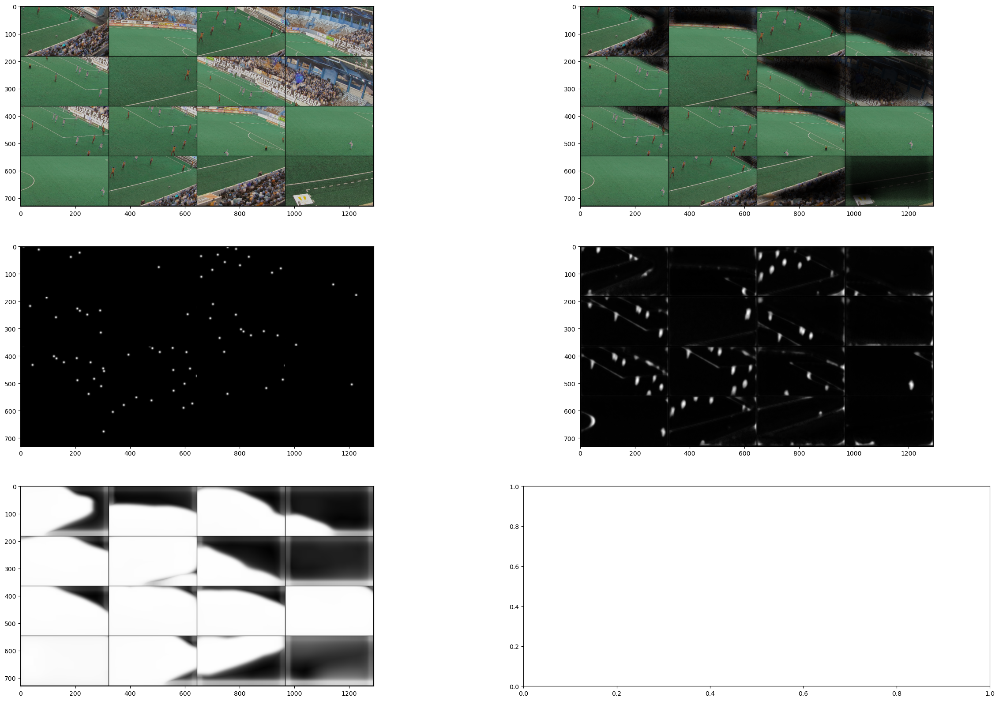

In [10]:
def gridify(img):
    return make_grid(img, nrow=4).permute((1, 2, 0)).cpu()

img_ = gridify(img)
img_cover_ = gridify(cover_blur * img)
heatmap_ = gridify(heatmap)
cover_blur_ = gridify(cover_blur)
mask_ = gridify(mask)

print('Output for display:')
print('img.shape  = ', img_.shape)
print('heatmap.shape = ', heatmap_.shape)
print('cover.shape = ', cover_blur_.shape)
print('mask.shape = ', mask_.shape)

fig, ax = plt.subplots(nrows=3, ncols=2, figsize=(30,20))
ax.flat[0].imshow(img_, cmap='gray')
ax.flat[1].imshow(img_cover_, cmap='gray')
ax.flat[2].imshow(mask_, cmap='gray')
ax.flat[3].imshow(heatmap_, cmap='gray')
ax.flat[4].imshow(cover_blur_, cmap='gray')
fig.show()

/var/folders/sb/bsmqpwg91sn_3fvr5z519y5c0000gn/T/ipykernel_78598/3745421930.py:2: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  clipped_heatmap_ = torch.tensor(heatmap_)
/var/folders/sb/bsmqpwg91sn_3fvr5z519y5c0000gn/T/ipykernel_78598/3745421930.py:9: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  fig.show()


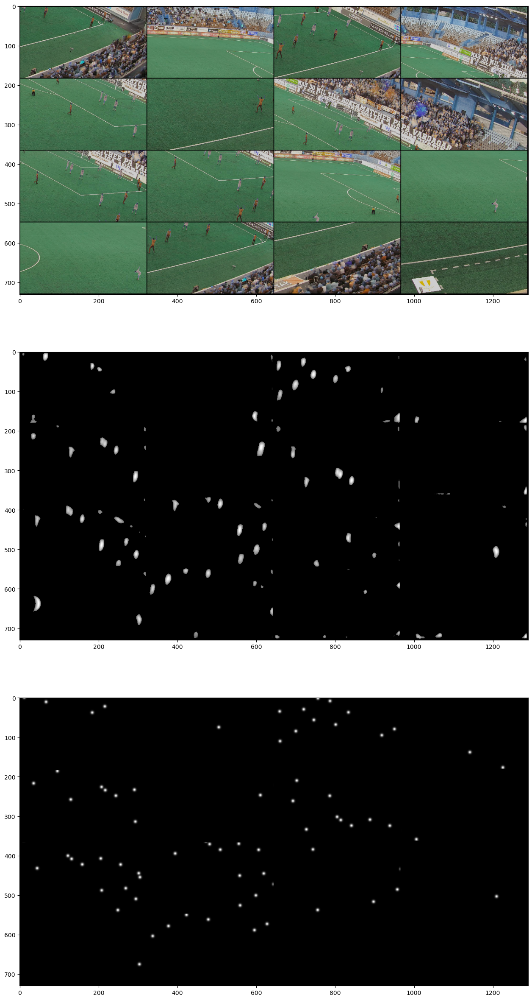

In [11]:
THRESHOLD = 0.40
clipped_heatmap_ = torch.tensor(heatmap_)
clipped_heatmap_[clipped_heatmap_ < THRESHOLD] = 0

fig, ax = plt.subplots(nrows=3, figsize=(40,30))
ax[0].imshow(img_, cmap='gray')
ax[1].imshow(clipped_heatmap_, cmap='gray')
ax[2].imshow(mask_, cmap='gray')
fig.show()

### GMM

In [12]:
%load_ext autoreload
%autoreload 2
from pipelines.player_detection.location_detector import LocationDetector

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [13]:
from sklearn.mixture import GaussianMixture, BayesianGaussianMixture
from sklearn.cluster import DBSCAN

torch.Size([1, 1, 180, 320])


/var/folders/sb/bsmqpwg91sn_3fvr5z519y5c0000gn/T/ipykernel_78598/528864734.py:6: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  heatmap_one = torch.tensor(heatmap_one)


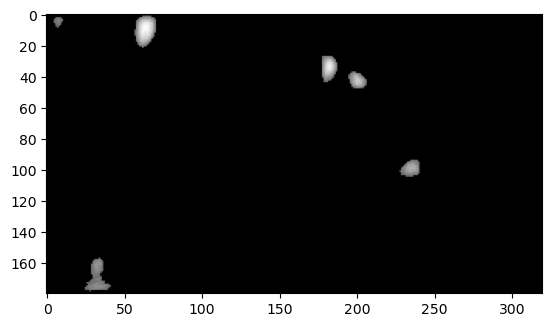

In [54]:
BATCH_IDX = 0
THRESHOLD = 0.40
heatmap_one = heatmap[[BATCH_IDX]]
heatmap_one[heatmap_one < THRESHOLD] = 0
# heatmap_one = MinMaxScaler().fit_transform(heatmap_one)
heatmap_one = torch.tensor(heatmap_one)

print(heatmap_one.shape)
plt.imshow(heatmap_one[0][0].detach().cpu(), cmap='gray')
plt.show()

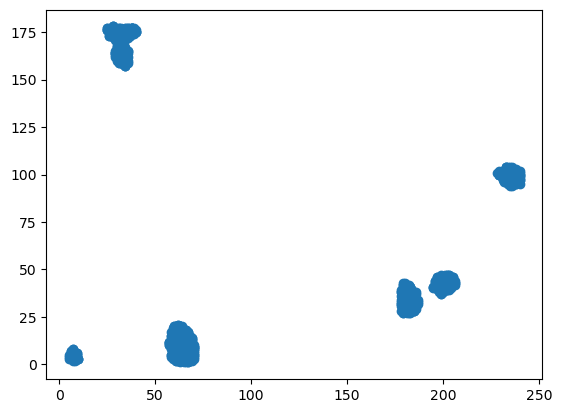

In [78]:
heatmap_one_idxs = torch.nonzero(heatmap_one, as_tuple=False)
heatmap_one_vals = heatmap_one[0, 0, heatmap_one_idxs[:, 2], heatmap_one_idxs[:, 3]]
probs = heatmap_one_vals / heatmap_one_vals.sum()

num_samples = 1000
chosen_idxs = torch.multinomial(probs, num_samples, replacement=True)

heatmap_one = heatmap_one.detach().cpu()

heatmap_one_chosen_idxs = heatmap_one_idxs[chosen_idxs]
heatmap_one_chosen_idxs = heatmap_one_chosen_idxs.cpu().numpy()
heatmap_one_chosen_idxs = heatmap_one_chosen_idxs[:, 2:]

plt.scatter(heatmap_one_chosen_idxs[:, 1], heatmap_one_chosen_idxs[:, 0])

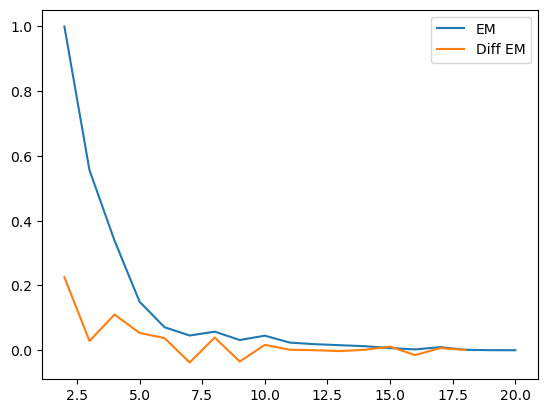

In [80]:
ks = range(2, 21, 1)
em_bounds = []

for k in ks:
    gmm = GaussianMixture(n_components=k).fit(heatmap_one_chosen_idxs)
    em_bounds.append(gmm.lower_bound_)
    # aics.append(gmm.aic(heatmap_one_idxs))
    # bics.append(gmm.bic(heatmap_one_idxs))

ks = np.array(ks)
em_bounds = np.array(em_bounds)
em_bounds = (em_bounds - em_bounds.max()) / (em_bounds.min() - em_bounds.max())

plt.plot(ks, em_bounds, label='EM')
plt.plot(ks[:-2], np.diff(np.diff(em_bounds)), label='Diff EM')
plt.legend()
plt.show()


In [81]:
best_k = 4 + ks[np.argmax(-np.diff(em_bounds))]
best_k
# best_k = 10

np.int64(6)

Initialization 0
  Iteration 10	 time lapse 0.01298s	 ll change 0.00099
Initialization converged. time lapse 0.01303s	 lower bound -6.75638.
20 keypoints detected.


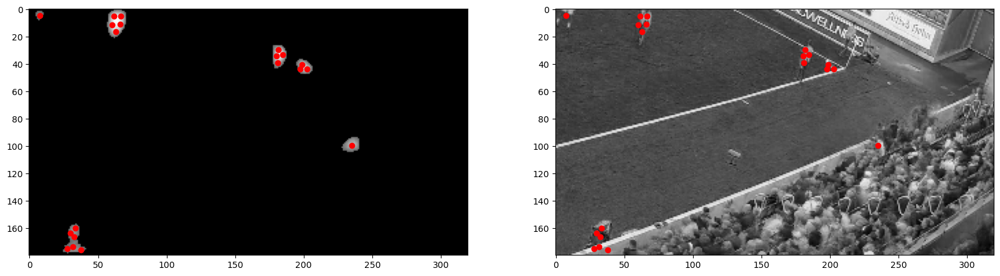

In [83]:
gmm = GaussianMixture(n_components=20, covariance_type='spherical', verbose=2).fit(heatmap_one_chosen_idxs)
Ys, Xs = gmm.means_.T
print(f'{len(Ys)} keypoints detected.')

fig, axes = plt.subplots(ncols=2, figsize=(20, 10))

axes[0].imshow(heatmap_one[0][0], cmap='gray')
axes[0].scatter(Xs, Ys, c='red')

axes[1].imshow(img[BATCH_IDX][0].detach().cpu(), cmap='gray')
axes[1].scatter(Xs, Ys, c='red')

plt.show()

Initialization 0
  Iteration 10	 time lapse 0.03696s	 ll change 26.93697
Initialization converged. time lapse 0.05085s	 lower bound -7249.33066.
Initialization 1
  Iteration 10	 time lapse 0.01503s	 ll change 32.82805
Initialization converged. time lapse 0.01721s	 lower bound -7202.28183.
Initialization 2
  Iteration 10	 time lapse 0.01554s	 ll change 37.78809
Initialization converged. time lapse 0.02110s	 lower bound -7208.42048.
Initialization 3
  Iteration 10	 time lapse 0.01487s	 ll change 16.07593
Initialization converged. time lapse 0.02026s	 lower bound -7332.03487.
Initialization 4
  Iteration 10	 time lapse 0.01608s	 ll change 22.23646
Initialization converged. time lapse 0.02445s	 lower bound -7195.12981.
5 keypoints detected.


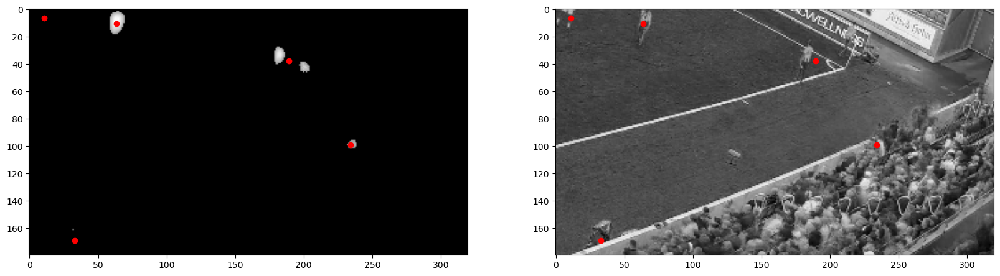

In [90]:
bgmm = BayesianGaussianMixture(
    n_components=30, covariance_type='spherical', verbose=2,
    max_iter=100,
    tol=1e-3,
    n_init=5, 
    weight_concentration_prior=1e-1
).fit(heatmap_one_chosen_idxs)
Ys, Xs = bgmm.means_.T[:, np.where(bgmm.weights_ >= 0.01)]

fig, axes = plt.subplots(ncols=2, figsize=(20, 10))

print(f'{Ys.shape[1]} keypoints detected.')
axes[0].imshow(heatmap_one[0][0], cmap='gray')
axes[0].scatter(Xs, Ys, c='red')

axes[1].imshow(img[BATCH_IDX][0].detach().cpu(), cmap='gray')
axes[1].scatter(Xs, Ys, c='red')

plt.show()

In [ ]:
print(bgmm.weights_)

[    0.13571    0.084809    0.073606     0.02102   0.0010064   0.0010049   0.0010034     0.10387    0.058314     0.07705  0.00099623   0.0009938     0.10844  0.00098861     0.12277     0.11047    0.097855  8.7221e-05  7.9291e-06  7.2083e-07   6.553e-08  5.9573e-09  5.4157e-10  4.9234e-11  4.4758e-12  4.0689e-13
   3.699e-14  3.3627e-15   3.057e-16  2.7791e-17]


torch.Size([3]) keypoints detected.


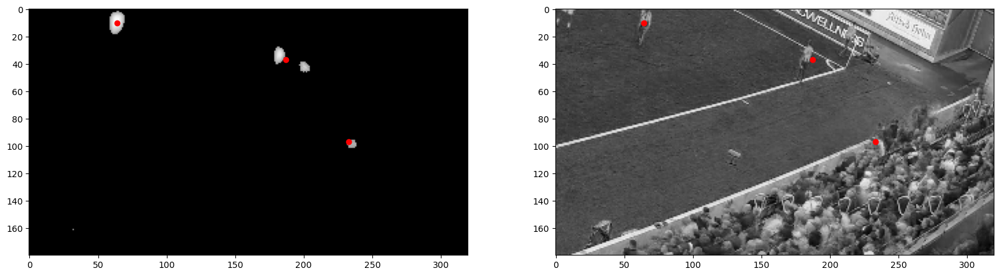

In [91]:
Ys, Xs = LocationDetector(max_components=33) \
    .forward(heatmap_one) \
    .T

print(f'{Ys.shape} keypoints detected.')
fig, axes = plt.subplots(ncols=2, figsize=(20, 10))

axes[0].imshow(heatmap_one[0][0], cmap='gray')
axes[0].scatter(Xs, Ys, c='red')

axes[1].imshow(img[BATCH_IDX][0].detach().cpu(), cmap='gray')
axes[1].scatter(Xs, Ys, c='red')

plt.show()

## Putting things together

In [92]:
import gc
gc.collect()
torch.mps.empty_cache()

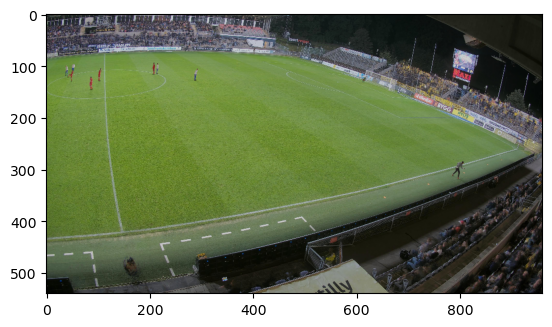

In [121]:
img, *_ = ds[6]
img = torch.tensor(img).permute((2, 0, 1)).unsqueeze(0).to(DEVICE)
img_small = TorchF.interpolate(img, size=(540, 960)).detach()
plt.imshow(img_small[0].permute((1, 2, 0)).cpu())
plt.show()

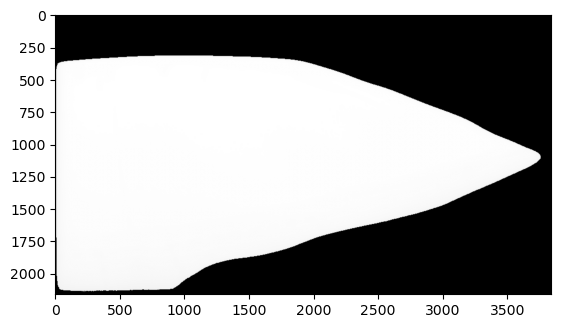

In [122]:
segments = pitch_cover_model(img_small)
# segments = TorchvisionF.gaussian_blur(segments, kernel_size=3, sigma=3.)
segments[segments < 0.95] = 0

segments = TorchF.interpolate(segments, size=(2160, 3840))
plt.imshow(segments[0].permute((1, 2, 0)).detach().cpu(), cmap='gray')

In [123]:
# segment_pts = segments[0][0].T.nonzero().cpu().numpy()
# segment_hull = cv2.convexHull(segment_pts)
# segment_hull.shape

In [124]:
%load_ext autoreload
%autoreload 2

from pipelines.player_detection.crop_then_stitch import CropThenStitch
from pipelines.player_detection.crop_then_stack import CropThenStack
from pipelines.player_detection.location_detector import LocationDetector

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


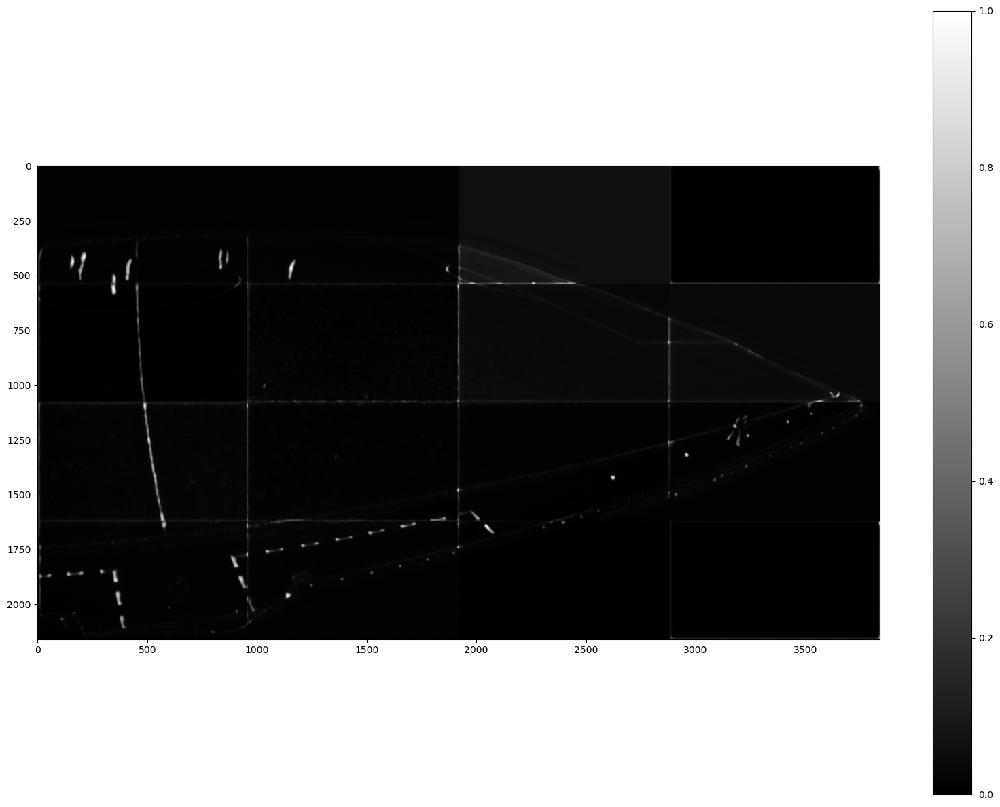

In [125]:
player_mask_all = CropThenStitch(gaussian_model, (540, 960)).to('mps')((segments * img).to('mps'))
plt.figure(figsize=(20, 15))
_img = plt.imshow(player_mask_all[0][0].cpu(), cmap='gray', vmin=0, vmax=1)
plt.colorbar(_img)
plt.show()

In [143]:
THRESHOLD = 0.60
clipped_mask_all = player_mask_all.detach().cpu()
clipped_mask_all = clipped_mask_all.mean(axis=1).unsqueeze(1)
clipped_mask_all[clipped_mask_all < THRESHOLD] = 0
clipped_mask_all.shape

torch.Size([1, 1, 2160, 3840])

/var/folders/sb/bsmqpwg91sn_3fvr5z519y5c0000gn/T/ipykernel_78598/2709473881.py:5: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  fig.show()


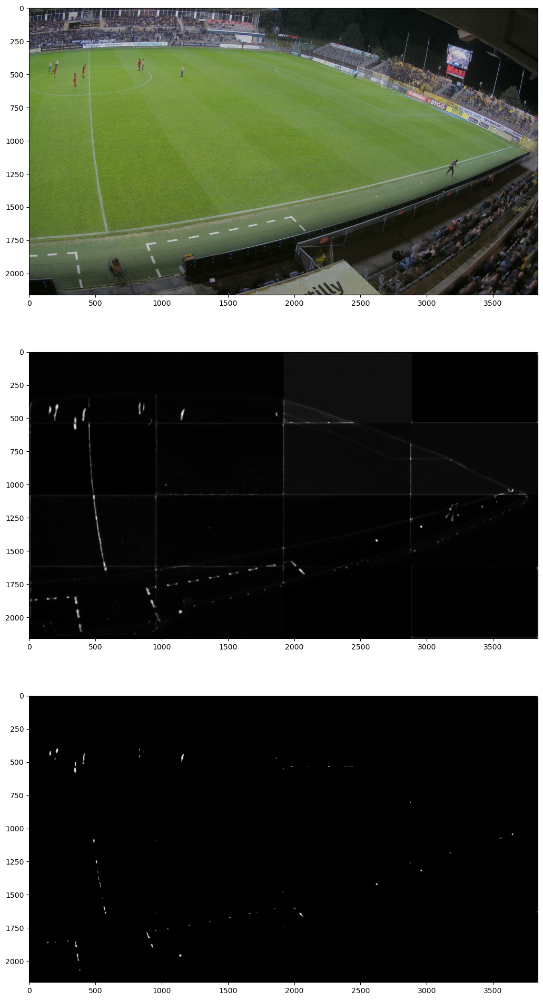

In [144]:
fig, ax = plt.subplots(nrows=3, figsize=(20, 24))
ax[0].imshow(img[0].permute((1, 2, 0)).detach().cpu())
ax[1].imshow(player_mask_all[0][0].cpu(), cmap='gray')
ax[2].imshow(clipped_mask_all[0][0].cpu(), cmap='gray')
fig.show()

In [145]:
player_mask_all.shape

torch.Size([1, 3, 2160, 3840])

In [146]:
%load_ext autoreload
%autoreload 2

from pipelines.player_detection.crop_then_stitch import CropThenStitch
from pipelines.player_detection.crop_then_stack import CropThenStack
from pipelines.player_detection.location_detector import LocationDetector

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [147]:
keypoints, offsets = CropThenStack(
    LocationDetector(tol=0.05, num_samples=1000), 
    window_crop=(540, 960), 
    batch_size_per_image=1
)(clipped_mask_all)

keypoints.shape

0it [00:00, ?it/s]/Users/sam/miniconda3/envs/ISC-Football/lib/python3.12/site-packages/sklearn/mixture/_base.py:275: ConvergenceWarning: Best performing initialization did not converge. Try different init parameters, or increase max_iter, tol, or check for degenerate data.
  warnings.warn(
/Users/sam/miniconda3/envs/ISC-Football/lib/python3.12/site-packages/sklearn/mixture/_base.py:275: ConvergenceWarning: Best performing initialization did not converge. Try different init parameters, or increase max_iter, tol, or check for degenerate data.
  warnings.warn(
4it [00:00, 34.03it/s]/Users/sam/miniconda3/envs/ISC-Football/lib/python3.12/site-packages/sklearn/mixture/_base.py:275: ConvergenceWarning: Best performing initialization did not converge. Try different init parameters, or increase max_iter, tol, or check for degenerate data.
  warnings.warn(
8it [00:00, 36.63it/s]/Users/sam/miniconda3/envs/ISC-Football/lib/python3.12/site-packages/sklearn/mixture/_base.py:275: ConvergenceWarning: 

torch.Size([60, 2])

In [148]:
pts = keypoints + offsets[:, :2]
# pts = offsets[:, :2]

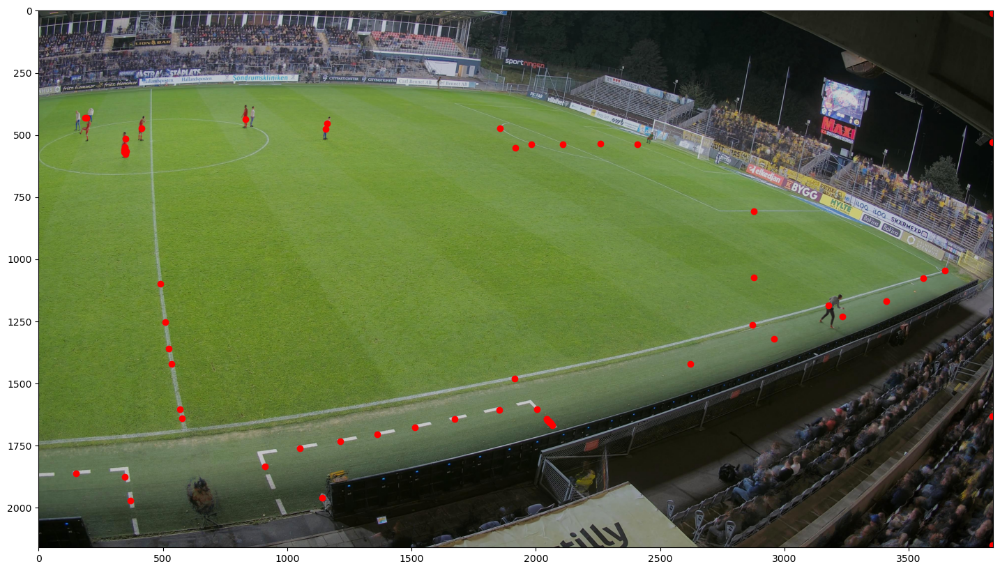

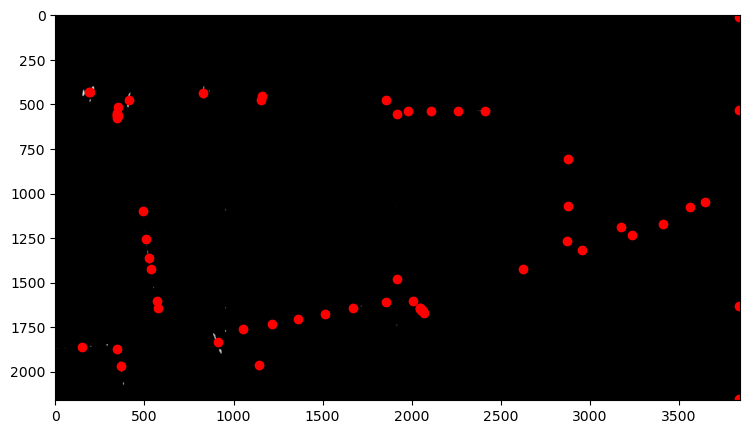

In [149]:
plt.figure(figsize=(20, 10))

plt.imshow(img[0].permute((1, 2, 0)).detach().cpu())
plt.scatter(pts[:, 1].detach().cpu(), pts[:, 0].detach().cpu(), c='red')
plt.show()

plt.figure(figsize=(10, 5))

plt.imshow(clipped_mask_all[0][0].detach().cpu(), cmap='gray')
plt.scatter(pts[:, 1].detach().cpu(), pts[:, 0].detach().cpu(), c='red')
plt.show()